In [1]:
import argparse
import os
import random
from collections import OrderedDict

import numba
import numpy as np
import PIL
import torch
from gym.spaces import Box, Dict, Discrete

import habitat
from habitat import Config
from habitat.core.agent import Agent
from habitat_baselines.utils.common import batch_obs
from habitat_baselines.config.default import get_config


from habitat_baselines.rl.ddppo.policy.resnet_policy import PointNavResNetPolicy
from env_orb import Env

import torch
from torch.autograd import Variable
from torchvision.transforms import ToTensor, ToPILImage
import torch.nn.functional as F
from scipy import ndimage

import torch.distributed as dist
from habitat.tasks.nav.shortest_path_follower import ShortestPathFollower
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Circle
import glob
import time
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import matplotlib

Neither `ifconfig` (`ifconfig -a`) nor `ip` (`ip address show`) commands are available, listing network interfaces is likely to fail


In [2]:
from utils import FrameSkip, FrameStack, draw_top_down_map, plot_colortable, rand_cmap
import utils_for_vectorenv
from habitat import make_dataset

In [3]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["CUDA_LAUNCH_BLOCKING"]="1"

import os
os.environ["MKL_NUM_THREADS"] = "1" 
os.environ["NUMEXPR_NUM_THREADS"] = "1" 
os.environ["OMP_NUM_THREADS"] = "1" 

In [4]:
W = 640
H = 480
config_env = get_config(
    "ddppo_objectnav.yaml", ["BASE_TASK_CONFIG_PATH", 'challenge_objectnav2022.local.rgbd.yaml']).clone()
config_env.defrost()
config_env.TASK_CONFIG.SIMULATOR.AGENT_0.SENSORS.append("SEMANTIC_SENSOR")
config_env.TASK_CONFIG.SIMULATOR.RGB_SENSOR.HEIGHT = H
config_env.TASK_CONFIG.SIMULATOR.RGB_SENSOR.WIDTH = W
config_env.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.HEIGHT = H
config_env.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.WIDTH = W
config_env.TASK_CONFIG.SIMULATOR.SEMANTIC_SENSOR.WIDTH = W
config_env.TASK_CONFIG.SIMULATOR.SEMANTIC_SENSOR.HEIGHT = H
config_env.TASK_CONFIG.TASK.POSSIBLE_ACTIONS = ["STOP", "MOVE_FORWARD", "TURN_LEFT", "TURN_RIGHT", "LOOK_UP", "LOOK_DOWN"]

config_env.TASK_CONFIG.TASK.MEASUREMENTS.append("TOP_DOWN_MAP")
config_env.TASK_CONFIG.TASK.SENSORS.append("HEADING_SENSOR")
config_env.TASK_CONFIG.TASK.SENSORS = ['OBJECTGOAL_SENSOR', 'COMPASS_SENSOR', 'GPS_SENSOR', 'HEADING_SENSOR']

"""
config_env.TASK_CONFIG.SIMULATOR.RGB_SENSOR.NOISE_MODEL = 'GaussianNoiseModel'
config_env.TASK_CONFIG.SIMULATOR.RGB_SENSOR.NOISE_MODEL_KWARGS = habitat.config.default.Config()
config_env.TASK_CONFIG.SIMULATOR.RGB_SENSOR.NOISE_MODEL_KWARGS.intensity_constant = 0.1
config_env.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.NOISE_MODEL = "RedwoodDepthNoiseModel"
#config.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.NOISE_MODEL_KWARGS = habitat.Config()
#config.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.NOISE_MODEL_KWARGS.noise_multiplier = 2. #2.
config_env.TASK_CONFIG.SIMULATOR.ACTION_SPACE_CONFIG = 'pyrobotnoisy'
config_env.TASK_CONFIG.SIMULATOR.NOISE_MODEL = habitat.config.default.Config()
config_env.TASK_CONFIG.SIMULATOR.NOISE_MODEL.ROBOT = "LoCoBot"
config_env.TASK_CONFIG.SIMULATOR.NOISE_MODEL.CONTROLLER = 'Proportional'
config_env.TASK_CONFIG.SIMULATOR.NOISE_MODEL.NOISE_MULTIPLIER = 0.1

#config_env.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.MAX_DEPTH = 10.
#config_env.TASK_CONFIG.SIMULATOR.DEPTH_SENSOR.MIN_DEPTH = 0.
#config_env.TASK_CONFIG.SIMULATOR.TURN_ANGLE = 10
#config_env.TASK_CONFIG.SIMULATOR.TILT_ANGLE = 10
"""
config_env.TASK_CONFIG.SIMULATOR.HABITAT_SIM_V0.ALLOW_SLIDING = False
config_env.TASK_CONFIG.ENVIRONMENT.ITERATOR_OPTIONS.SHUFFLE = False


config_env.TASK_CONFIG.DATASET.SPLIT = 'val'


config_env.TASK_CONFIG.ENVIRONMENT.MAX_EPISODE_STEPS = 500
config_env.TASK_CONFIG.TASK.TOP_DOWN_MAP.MAX_EPISODE_STEPS = 500

config_env.TASK_CONFIG.SIMULATOR.SCENE_DATASET = '/data/scene_datasets/hm3d/hm3d_annotated_basis.scene_dataset_config.json'
config_env.TASK_CONFIG.DATASET.SCENES_DIR = '/data/scene_datasets/'
config_env.TASK_CONFIG.DATASET.DATA_PATH = '/data/datasets/objectnav/hm3d/{split}/{split}.json.gz'

config_env.freeze()

In [5]:
#from resnet_policy_fusion import ResNetPolicy as Policy_3fusion
from resnet_policy import PointNavResNetPolicy
from hab_base_utils_common import batch_obs
class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")    

In [6]:
import os
from typing import Any, Dict, List, Optional, Sequence, Tuple
import imageio
import numpy as np
import scipy.ndimage
from habitat.core.utils import try_cv2_import
from habitat.utils.visualizations import utils
from habitat.utils.visualizations import maps

In [7]:
MAP_INVALID_POINT = 0
MAP_VALID_POINT = 1
MAP_BORDER_INDICATOR = 2
MAP_SOURCE_POINT_INDICATOR = 4
MAP_TARGET_POINT_INDICATOR = 6
MAP_SHORTEST_PATH_COLOR = 7
MAP_VIEW_POINT_INDICATOR = 8
MAP_TARGET_BOUNDING_BOX = 9
TOP_DOWN_MAP_COLORS = np.full((256, 3), 150, dtype=np.uint8)
TOP_DOWN_MAP_COLORS[10:] = cv2.applyColorMap(np.arange(246, dtype=np.uint8), cv2.COLORMAP_JET).squeeze(1)[:, ::-1]
TOP_DOWN_MAP_COLORS[MAP_INVALID_POINT] = [255, 255, 255]  # White
TOP_DOWN_MAP_COLORS[MAP_VALID_POINT] = [150, 150, 150]  # Light Grey
TOP_DOWN_MAP_COLORS[MAP_BORDER_INDICATOR] = [50, 50, 50]  # Grey
TOP_DOWN_MAP_COLORS[MAP_SOURCE_POINT_INDICATOR] = [0, 0, 200]  # Blue
TOP_DOWN_MAP_COLORS[MAP_TARGET_POINT_INDICATOR] = [200, 0, 0]  # Red
TOP_DOWN_MAP_COLORS[MAP_SHORTEST_PATH_COLOR] = [0, 200, 0]  # Green
TOP_DOWN_MAP_COLORS[MAP_VIEW_POINT_INDICATOR] = [245, 150, 150]  # Light Red
TOP_DOWN_MAP_COLORS[MAP_TARGET_BOUNDING_BOX] = [0, 175, 0]  # Green

In [8]:
def colorize_topdown_map(
    top_down_map: np.ndarray,
    fog_of_war_mask: Optional[np.ndarray] = None,
    fog_of_war_desat_amount: float = 0.5,
    skill: float =1
) -> np.ndarray:
    r"""Convert the top down map to RGB based on the indicator values.
    Args:
        top_down_map: A non-colored version of the map.
        fog_of_war_mask: A mask used to determine which parts of the
            top_down_map are visible
            Non-visible parts will be desaturated
        fog_of_war_desat_amount: Amount to desaturate the color of unexplored areas
            Decreasing this value will make unexplored areas darker
            Default: 0.5
    Returns:
        A colored version of the top-down map.
    """
    TOP_DOWN_MAP_COLORS[10:] = np.array([[  0, 252, 255] for i in range(246)])
    
    for i in range(len(start_pnav)):
        start = start_pnav[i]
        end = end_pnav[i]
        start_ = int(246*(start/500))
        end_ = int(246*(end/500))
        if end_-start_>1:
            TOP_DOWN_MAP_COLORS[11+start_:11+end_] = np.array([[0,0,128] for i in range(end_-start_)])
        
    for i in range(len(start_gr)):
        start = start_gr[i]
        end = end_gr[i]
        start_ = int(246*(start/500))
        end_ = int(246*(end/500))
        if end_-start_>1:
            TOP_DOWN_MAP_COLORS[11+start_:11+end_] = np.array([[168,0,0] for i in range(end_-start_)])

    _map = TOP_DOWN_MAP_COLORS[top_down_map]

    if fog_of_war_mask is not None:
        fog_of_war_desat_values = np.array([[fog_of_war_desat_amount], [1.0]])
        # Only desaturate things that are valid points as only valid points get revealed
        desat_mask = top_down_map != MAP_INVALID_POINT

        _map[desat_mask] = (
            _map * fog_of_war_desat_values[fog_of_war_mask]
        ).astype(np.uint8)[desat_mask]
  

    return _map

In [9]:
def colorize_topdown_map_critic(
    top_down_map: np.ndarray,
    fog_of_war_mask: Optional[np.ndarray] = None,
    fog_of_war_desat_amount: float = 0.5,
    skill: float =1
) -> np.ndarray:
    r"""Convert the top down map to RGB based on the indicator values.
    Args:
        top_down_map: A non-colored version of the map.
        fog_of_war_mask: A mask used to determine which parts of the
            top_down_map are visible
            Non-visible parts will be desaturated
        fog_of_war_desat_amount: Amount to desaturate the color of unexplored areas
            Decreasing this value will make unexplored areas darker
            Default: 0.5
    Returns:
        A colored version of the top-down map.
    """
    TOP_DOWN_MAP_COLORS[10:] = np.array([[  0, 252, 255] for i in range(246)])
    
    crit_val = np.clip(agnt.critic_values,0.,4.)
    map_traj_length = np.unique(info["top_down_map"]["map"]).max() - 9 
    xp = np.arange(len(crit_val), dtype=np.int32)/len(crit_val)*map_traj_length
    fp = np.array(crit_val)/4*255 #- min(np.array(agnt.critic_values)/4*255)
    color_values = []
    for i in range(map_traj_length):
        color_values.append(min(int(np.interp(i, xp, fp)),254))    
    print(map_traj_length,color_values,len(color_values))    
   
    new_colors = np.array(cv2.applyColorMap(np.arange(255, dtype=np.uint8), cv2.COLORMAP_TURBO).squeeze(1)[:,::-1])[color_values]
    TOP_DOWN_MAP_COLORS[10:10+map_traj_length] = new_colors
    
    for i in range(len(start_pnav)):
        start = start_pnav[i]
        start_ = int(246*(start/500))
        if len(end_pnav)<len(start_pnav):
            TOP_DOWN_MAP_COLORS[11+start_:] = np.array([[0,0,128] for i in range(end_-start_)])
        else:    
            end = end_pnav[i]
            end_ = int(246*(end/500))
            if end_-start_>1:
                TOP_DOWN_MAP_COLORS[11+start_:11+end_] = np.array([[0,0,128] for i in range(end_-start_)])
               
    for i in range(len(start_gr)):
        start = start_gr[i]
        start_ = int(246*(start/500))
        if len(end_gr)<len(start_gr):
            TOP_DOWN_MAP_COLORS[11+start_:] = np.array([[255,255,255] for i in range(end_-start_)])
        else:
            end = end_gr[i]
            end_ = int(246*(end/500))
            if end_-start_>1:
                #print(TOP_DOWN_MAP_COLORS.shape,end_,start_)
                TOP_DOWN_MAP_COLORS[11+start_:11+end_] = np.array([[255,255,255] for i in range(end_-start_)])
         
    
    _map = TOP_DOWN_MAP_COLORS[top_down_map]

    if fog_of_war_mask is not None:
        fog_of_war_desat_values = np.array([[fog_of_war_desat_amount], [1.0]])
        # Only desaturate things that are valid points as only valid points get revealed
        desat_mask = top_down_map != MAP_INVALID_POINT

        _map[desat_mask] = (
            _map * fog_of_war_desat_values[fog_of_war_mask]
        ).astype(np.uint8)[desat_mask]
  

    return _map

In [10]:
def to_gt_map(x):
    original_map_size = maps.colorize_topdown_map(info["top_down_map"]["map"], info["top_down_map"]["fog_of_war_mask"]).shape[:2]
    map_scale = np.array((1, original_map_size[1] * 1.0 / original_map_size[0]))
    new_map_size = np.round(obs['rgb'][0].shape[0] * map_scale).astype(np.int32)
    cord_to_map1 = x
    cord_map1 = np.round(maps.to_grid(cord_to_map1[2],cord_to_map1[0],one_env.task .measurements.__dict__['measures']['top_down_map']._top_down_map.shape[0:2],sim=one_env._sim)).astype(np.int32)[::-1] #one_env._sim)* new_map_size / original_map_size
    return cord_map1

In [11]:
import io
def get_img_from_fig(fig, dpi=180):
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=dpi)
    buf.seek(0)
    img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
    buf.close()
    img = cv2.imdecode(img_arr, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return img

# One_env

In [ ]:
one_env = Env(config=config_env)

In [14]:
eval_episodes = []
prev_scene = one_env._episode_iterator.episodes[0].scene_id.split('/')[-1]
scenes = [prev_scene]
print('0','\t',one_env._episode_iterator.episodes[0].scene_id.split('/')[-1])#,np.round(one_env.closest_dist[0],2))
for ii,i in enumerate(one_env.eps):
    nex_scene = one_env._episode_iterator.episodes[i].scene_id.split('/')[-1]
    if nex_scene!=prev_scene:
        print(ii,'\t',nex_scene)#,np.round(one_env.closest_dist[ii],2)
        prev_scene=nex_scene
        eval_episodes.append(ii)

0 	 4ok3usBNeis.basis.glb
99 	 5cdEh9F2hJL.basis.glb
198 	 6s7QHgap2fW.basis.glb
297 	 DYehNKdT76V.basis.glb
396 	 Dd4bFSTQ8gi.basis.glb
495 	 Nfvxx8J5NCo.basis.glb
594 	 QaLdnwvtxbs.basis.glb
693 	 TEEsavR23oF.basis.glb
792 	 XB4GS9ShBRE.basis.glb
891 	 bxsVRursffK.basis.glb
990 	 cvZr5TUy5C5.basis.glb
1089 	 mL8ThkuaVTM.basis.glb
1188 	 mv2HUxq3B53.basis.glb
1287 	 p53SfW6mjZe.basis.glb
1386 	 q3zU7Yy5E5s.basis.glb
1485 	 qyAac8rV8Zk.basis.glb
1584 	 svBbv1Pavdk.basis.glb
1683 	 wcojb4TFT35.basis.glb
1782 	 ziup5kvtCCR.basis.glb
1881 	 zt1RVoi7PcG.basis.glb


In [15]:
%load_ext autoreload
%autoreload 2

In [16]:
import sys
sys.path.append('/bps-nav')
from agent_segformer import Agent_hlpo
agnt = Agent_hlpo()

Failed to import TensorRT, no inference acceleration
Failed to import TensorRT, no inference acceleration
!input_channels_baseplanes_ngroups  5 32 16
!!num_compression_channels  228 3 120 0.03125
(8, 10)
2048 32
Use load_from_local loader


In [17]:
eval_episodes = [3, 4, 5, 7, 99, 100, 101, 102, 103, 104, 106, 107, 198, 199, 200, 202, 203, 204, 205, 206, 297, 299, 300, 301, 303, 304, 305, 396, 397, 398, 399, 401, 402, 403, 495, 496, 497, 498, 499, 501, 503, 594, 595, 596, 597, 598, 599, 600, 602, 693, 694, 696, 697, 698, 700, 701, 792, 793, 794, 795, 797, 798, 799, 800, 891, 894, 895, 896, 899, 990, 991, 992, 994, 996, 997, 998, 1089, 1093, 1094, 1095, 1096, 1097, 1188, 1189, 1191, 1192, 1193, 1194, 1195, 1196, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1386, 1387, 1390, 1391, 1392, 1393, 1394, 1485, 1486, 1487, 1489, 1493, 1584, 1585, 1587, 1588, 1589, 1590, 1591, 1592, 1684, 1685, 1686, 1687, 1688, 1690, 1691, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1881, 1885, 1886, 1888, 1889]


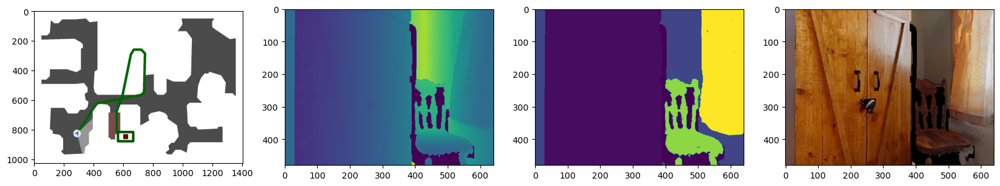

In [18]:
obs = one_env.reset(5); idd = 0
obs, reward, done, info = one_env.step(action=2)
obs, reward, done, info = one_env.step(action=3)
f = plt.figure(figsize=(20,10))
ax = f.add_subplot(1,4,1)
ax1 = f.add_subplot(1,4,2)
ax2 = f.add_subplot(1,4,3)
ax0 = f.add_subplot(1,4,4)
top_down_map = draw_top_down_map(info, obs["heading"][0], obs['rgb'][0].shape[0])
ax.imshow(top_down_map)
ax0.imshow(obs['rgb'])
ax1.imshow(obs['depth'][:,:,0])
ax2.imshow(one_env.sem_to_model)

In [29]:
obj = agnt.objgoal_to_cat[obs['objectgoal'][0]]
start_gr = []
end_gr = []
start_pnav = []
end_pnav = []
action5s = []
action0s = []
imgs = []
imgs_map = []
imgs_rgb = []
imgs_semantic = []

last_skilgr = False
last_skilpnav = False
agnt.reset()
while not done:
    action, obs_semantic, dpth = agnt.step_2skill(obs,semantic=True)
    imgs_map.append(draw_top_down_map(info, obs["heading"][0], obs['rgb'][0].shape[0]))
    #imgs_rgb.append(obs['rgb'])
    imgs_semantic.append(np.concatenate([obs['rgb'],np.concatenate([obs_semantic*100,obs_semantic*100,obs_semantic*100],2)],1))
    

    if agnt.lastACTION5[-2]==True:
        action5s.append(one_env.agent_pose)

    if agnt.zero_rls[-2]==True:
        action0s.append(one_env.agent_pose)

    obs, reward, done, info = one_env.step(action=action); idd+=1
    print(idd,'\t',agnt.skil_goalreacher,'\t',action,'\t', agnt.critic_values[-1])
    
    if last_skilgr==False and agnt.skil_goalreacher == True:
        start_gr.append(idd)
    if (last_skilgr==True and agnt.skil_goalreacher == False) or (action==0 and agnt.skil_goalreacher == True):
        end_gr.append(idd)  
    if idd==498 and agnt.skil_goalreacher == True:
        end_gr.append(idd)         

    last_skilgr = agnt.skil_goalreacher
    
    #"""
    f = plt.figure(figsize=(10,10))
    ax = f.add_subplot(2,2,1)
    ax1 = f.add_subplot(2,2,2)
    ax2 = f.add_subplot(2,2,3)
    ax0 = f.add_subplot(2,2,4)
    top_down_map = draw_top_down_map(info, obs["heading"][0], obs['rgb'][0].shape[0])
    ax.imshow(top_down_map)
    ax.set_title("Critic_value: "+str(agnt.critic_values[-1]))
    ax0.imshow(obs['rgb'])
    ax1.imshow(obs['depth'][:,:,0])
    ax2.imshow(obs_semantic[:,:,0])
    if len(action5s)>0:
        for pnt in action5s:
            ax.add_patch(Circle(to_gt_map(pnt),20,color='red'))
    if len(action0s)>0:
        for pnt in action0s:
            ax.add_patch(Circle(to_gt_map(pnt),10,color='yellow'))
    plot_img_np = get_img_from_fig(f)
    plt.close()
    imgs.append(plot_img_np)
    #"""
    
    
    
    
imgs = [{'plts':i} for i in imgs]       
imgs_map = [{'plts':i} for i in imgs_map]  
#imgs_rgb = [{'plts':i} for i in imgs_rgb]  
imgs_semantic = [{'plts':i} for i in imgs_semantic]  

1 	 False 	 3 	 2.9933841228485107
2 	 False 	 3 	 2.9420089721679688
3 	 False 	 3 	 2.9440197944641113
4 	 False 	 3 	 2.7990689277648926
5 	 False 	 3 	 2.7710347175598145
6 	 False 	 3 	 2.761390447616577
7 	 False 	 3 	 2.6484947204589844
8 	 False 	 3 	 2.605361223220825
9 	 False 	 1 	 3.3428306579589844
10 	 False 	 3 	 3.441960334777832
11 	 False 	 1 	 3.430053234100342
12 	 False 	 1 	 3.482558012008667
13 	 False 	 1 	 3.519221782684326
14 	 False 	 1 	 3.3355884552001953
15 	 False 	 1 	 3.4156227111816406
16 	 False 	 3 	 3.2811243534088135
17 	 False 	 1 	 3.4509778022766113
18 	 False 	 1 	 3.429060459136963
19 	 False 	 1 	 3.443782091140747
20 	 False 	 1 	 3.351428985595703
21 	 False 	 3 	 3.2412173748016357
22 	 False 	 1 	 3.012967348098755
23 	 False 	 2 	 2.920917510986328
24 	 False 	 2 	 3.040745735168457
25 	 False 	 2 	 2.9061338901519775
26 	 False 	 2 	 2.822615623474121
27 	 False 	 1 	 2.8443963527679443
28 	 False 	 1 	 2.9627633094787598
29 	 False 	 3

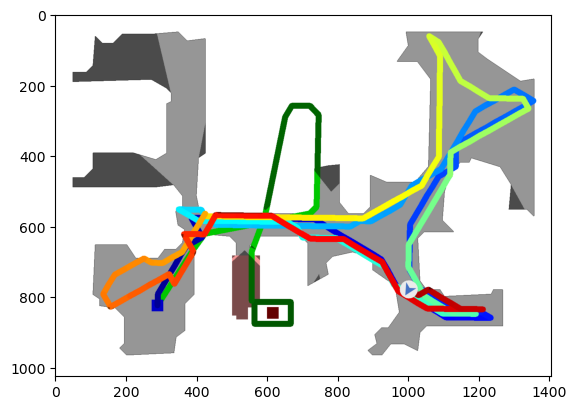

In [30]:
plt.imshow(top_down_map)

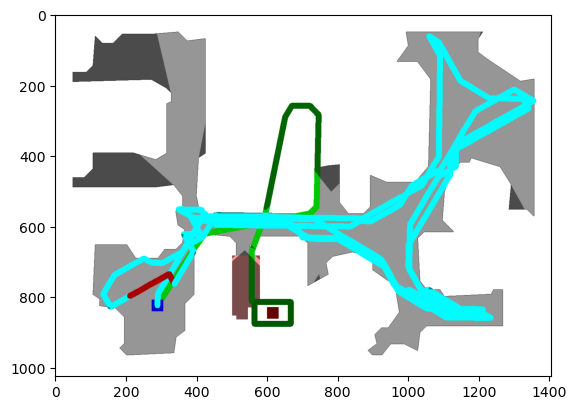

In [31]:
top_down_map = colorize_topdown_map(info["top_down_map"]["map"], info["top_down_map"]["fog_of_war_mask"])
plt.imshow(top_down_map)

In [ ]:
top_down_map = colorize_topdown_map_critic(info["top_down_map"]["map"], info["top_down_map"]["fog_of_war_mask"])
plt.imshow(top_down_map)

In [41]:
from habitat_sim.utils import viz_utils as vut
vut.make_video(
            imgs,
            "plts",
            "color",
            '/' + "sim_basics_3rd",
            open_vid=True,
            fps=10,
        )

Encoding the video: /sim_basics_3rd.mp4 


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1800, 1800) to (1808, 1808) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x561bb51368c0] Warning: data is not aligned! This can lead to a speed loss


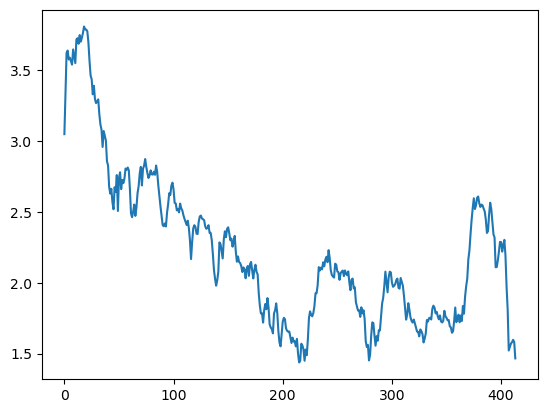

In [348]:
plt.plot(agnt.critic_values)

# RUN FULL VAL EPISODES with CRITIC MAP

In [20]:
eval_episodes = [3, 4, 5, 7, 99, 100, 101, 102, 103, 104, 106, 107, 198, 199, 200, 202, 203, 204, 205, 206, 297, 299, 300, 301, 303, 304, 305, 396, 397, 398, 399, 401, 402, 403, 495, 496, 497, 498, 499, 501, 503, 594, 595, 596, 597, 598, 599, 600, 602, 693, 694, 696, 697, 698, 700, 701, 792, 793, 794, 795, 797, 798, 799, 800, 891, 894, 895, 896, 899, 990, 991, 992, 994, 996, 997, 998, 1089, 1093, 1094, 1095, 1096, 1097, 1188, 1189, 1191, 1192, 1193, 1194, 1195, 1196, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1386, 1387, 1390, 1391, 1392, 1393, 1394, 1485, 1486, 1487, 1489, 1493, 1584, 1585, 1587, 1588, 1589, 1590, 1591, 1592, 1684, 1685, 1686, 1687, 1688, 1690, 1691, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1881, 1885, 1886, 1888, 1889]


In [ ]:
files = glob.glob('images_val_gtsem/*')
for f in files:
    os.remove(f)
for ep in eval_episodes:
    
    obs = one_env.reset(ep); idd = 0
    obs, reward, done, info = one_env.step(action=2)
    obs, reward, done, info = one_env.step(action=3)
    
    obj = agnt.objgoal_to_cat[obs['objectgoal'][0]]
    start_gr = [];    end_gr = [];    start_pnav = [];    end_pnav = []
    action5s = [];    action0s = []

    last_skilgr = False
    last_skilpnav = False
    agnt.reset()
    #for ssttpp in range(400):
    while not done:
        action, obs_semantic, dpth = agnt.step_2skill(obs,semantic=True)
        #imgs_map.append(draw_top_down_map(info, obs["heading"][0], obs['rgb'][0].shape[0]))
        #imgs_rgb.append(obs['rgb'])
        #imgs_semantic.append(np.concatenate([obs['rgb'],np.concatenate([obs_semantic*100,obs_semantic*100,obs_semantic*100],2)],1))

        if agnt.lastACTION5[-2]==True:
            action5s.append(one_env.agent_pose)

        if agnt.zero_rls[-2]==True:
            action0s.append(one_env.agent_pose)

        obs, reward, done, info = one_env.step(action=action); idd+=1

        if last_skilgr==False and agnt.skil_goalreacher == True:
            start_gr.append(idd)
        if (last_skilgr==True and agnt.skil_goalreacher == False) or (action==0 and agnt.skil_goalreacher == True):
            end_gr.append(idd)  
        if idd==498 and agnt.skil_goalreacher == True:
            end_gr.append(idd)         

        last_skilgr = agnt.skil_goalreacher
    
    f = plt.figure(figsize=(20,20))
    ax = f.add_subplot(2,2,1)
    ax1 = f.add_subplot(2,2,2)
    ax2 = f.add_subplot(2,2,3)
    ax0 = f.add_subplot(2,2,4)

    top_down_map = draw_top_down_map(info, obs["heading"][0], obs['rgb'][0].shape[0])
    ax0.imshow(top_down_map)
    top_down_map = colorize_topdown_map_critic(info["top_down_map"]["map"], info["top_down_map"]["fog_of_war_mask"])
    ax.imshow(top_down_map)
    top_down_map = colorize_topdown_map(info["top_down_map"]["map"], info["top_down_map"]["fog_of_war_mask"])
    ax1.imshow(top_down_map)
    spl = str(np.round(info['spl'],2))
    sspl = str(np.round(info['softspl'],2))
    suc = str(np.round(info['success'],2))
    ax.set_title('Obj: '+obj+'  SPL: '+spl+'  SoftSPL: '+sspl+'  Success: '+suc);
    if len(action5s)>0:
        for pnt in action5s:
            ax1.add_patch(Circle(to_gt_map(pnt),20,color='red'))
    if len(action0s)>0:
        for pnt in action0s:
            ax1.add_patch(Circle(to_gt_map(pnt),10,color='yellow'))
    ax2.plot(agnt.critic_values)
    
    name = './images_val_gtsem/'+str(ep)+'_'+obj+'_'+sspl+'_'+suc+'.png'
    print(name)
    f.savefig(name)   
    plt.close()
    
    

In [21]:
print('2RL VALmini Success GT semantic:',np.array([float(i.split('_')[-1].split('.')[0]) for i in os.listdir('/root/3FUSION_latest_challenge/images_val_gtsem') if 'checkpo' not in i]).mean())
print('2RL VALmini SoftSPL GT semantic:',np.array([float(i.split('_')[-2]) for i in os.listdir('/root/3FUSION_latest_challenge/images_val_gtsem') if 'checkpo' not in i]).mean())

2RL VALmini Success GT semantic: 0.60431654676259
2RL VALmini SoftSPL GT semantic: 0.3601438848920864
